<img src="h2i.jpg" alt="" width="200" align='right'/>

In [116]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import pickle
import os
from PIL import Image
import scipy
from scipy import misc
import cv2
import matplotlib.animation as animation
import time
%matplotlib inline
import copy

The grid2grid function takes the calculated coordinate system and returns the transformed x,y

In [2]:
def grid2grid(x,y,x_dis, y_dis):
    return (int(np.floor(x+x_dis/100.)), int(np.floor(y+y_dis/100.))) #distance divided by 100m per pixel

Random generated velocity and image to test whether this algorithm works, constant intensity

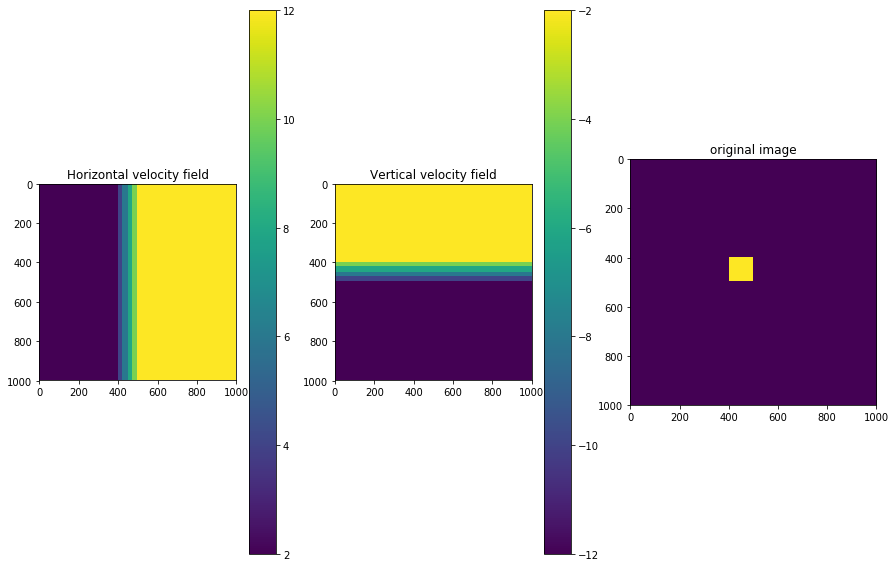

In [59]:
V = np.zeros((1000,1000,2))
V[:,:400,0]=2
V[:,400:420,0] = 4
V[:,420:450,0] = 6
V[:,450:470,0] = 8
V[:,470:500,0] = 10
V[:,500:,0] = 12

V[:400,:,1] = -2
V[400:420,:,1] = -4
V[420:450,:,1] = -6
V[450:470,:,1] = -8
V[470:500,:,1] = -10
V[500:,:,1] = -12

curr_img = np.zeros((1000,1000))
curr_img[400:500, 400:500] = 10

fig =plt.figure(figsize=(15,10))
fig.add_subplot(131)
plt.imshow(V[:,:,0])
plt.colorbar()
plt.title("Horizontal velocity field");
fig.add_subplot(132)
plt.imshow(V[:,:,1])
plt.colorbar()
plt.title("Vertical velocity field");
fig.add_subplot(133)
plt.imshow(curr_img)
plt.title("original image");

## Numerical Solutions

### Advection
To solve for the first order advection equation, numerical solutions are taken to adaptively calculate the image for the next time step and then transform the grid into predicted images
$$
    I_{x,y}^{t+1} = I_{x,y}^t-\frac{U*dt}{dx}(I_{x,y}^t-I_{x-dx,y}^{t})- \frac{V*dt}{dy}(I_{x,y}^t-I_{x,{y-dy}}^t)
$$

In [119]:
def ADE_solver(curr_img, V , dt, nt):
    U = V[:,:,0]
    V = V[:,:,1]
    pred=[]
    In = curr_img.copy()
    for t in range(0,dt*nt, dt):
        pred_img = np.zeros((1000,1000))
        In[1:,1:] = curr_img[1:,1:] -U[1:,1:]*dt/100.*(curr_img[1:,1:]-curr_img[1:,0:-1]) -\
                    V[1:,1:]*dt/100.*(curr_img[1:,1:]-curr_img[0:-1,1:])
        x,y = np.where(In!=0)
        for (m,n) in zip(x,y):
            d_x, d_y = U[m,n]*dt, V[m,n]*dt
#            new_mat = diffusion(nx,ny,dt,D)*In[m,n]
            (trans_i, trans_j) = grid2grid(m,n,d_y,d_x)
            if 0<=trans_i<=999 and 0<=trans_j<=999: 
#                pred_img[trans_i-int(nx/2):trans_i+int(nx/2), trans_j-int(nx/2):trans_j+int(nx/2)] += new_mat
                pred_img[trans_i, trans_j] = In[m,n]
        curr_img=pred_img
        if t%60==0:
#            x,y = np.where(In!=0)
#            for (m,n) in zip(x,y):
#                d_x, d_y = U[m,n]*t, V[m,n]*t
#                new_mat = diffusion(nx,ny,dt,D)*In[m,n]
#                (trans_i, trans_j) = grid2grid(m,n,d_y,d_x)
#                if 0<=trans_i<=999 and 0<=trans_j<=999: 
#                    pred_img[trans_i-int(nx/2):trans_i+int(nx/2), trans_j-int(nx/2):trans_j+int(nx/2)] += new_mat
            pred_img[pred_img<0.5] = 0
            pred_img[pred_img>=0.5] = 1
            scipy.misc.imsave(f'D:/Radar Projects/lizhi/for LiZhi/WindField/ADE-{t}.png', pred_img)
            print(int(t/60),' mins processed')
            pred.append(pred_img)
    return pred


pred = ADE_solver(curr_img,V,5,360)

D:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:28: DeprecationWarning: `imsave` is deprecated!
`imsave` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imwrite`` instead.


0  mins processed
1  mins processed
2  mins processed
3  mins processed
4  mins processed
5  mins processed
6  mins processed
7  mins processed
8  mins processed
9  mins processed
10  mins processed
11  mins processed
12  mins processed
13  mins processed
14  mins processed
15  mins processed
16  mins processed
17  mins processed
18  mins processed
19  mins processed
20  mins processed
21  mins processed
22  mins processed
23  mins processed
24  mins processed
25  mins processed
26  mins processed
27  mins processed
28  mins processed
29  mins processed


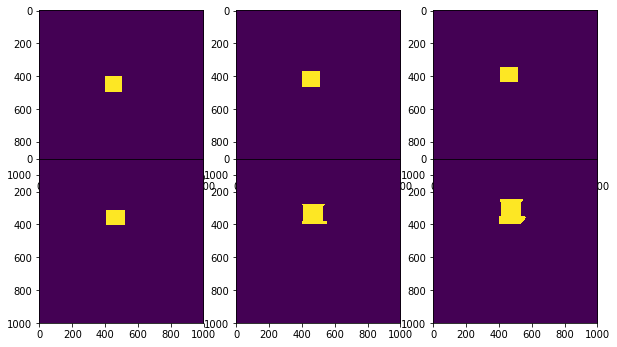

In [112]:
fig = plt.figure(figsize=(10,10))
fig.add_subplot(231)
plt.imshow(pred[0])
fig.add_subplot(232)
plt.imshow(pred[1])
fig.add_subplot(233)
plt.imshow(pred[2])
fig.add_subplot(131)
plt.imshow(pred[3])
fig.add_subplot(132)
plt.imshow(pred[4])
fig.add_subplot(133)
plt.imshow(pred[5])

### Advection + Diffusion

The first oder Advection equation is not able to fill the gaps e.g. some pixels run faster than others, then gaps will be created. The other way is to add second order term - diffusion. One simple way of taking this sparse distribution into account is by Gaussian filter. In each pixel, the additional Gaussian diffusion term will be added. This should be calibrated because it can not be realistic high as it will cause merge, and if it is low, it would not cover the gaps. Of course, it depends on velocity field.

$$
T(x,y,t)=\frac{1}{4\pi*dt}exp(\frac{-(x-x_0)^2}{4Dt_0}+\frac{-(y-y_0)^2}{4Dt_0})
$$

$$
    I_{x,y}^{t+1} = I_{x,y}^t-\frac{U*dt}{dx}(I_{x,y}^t-I_{x-dx,y}^{t})- \frac{V*dt}{dy}(I_{x,y}^t-I_{x,{y-dy}}^t)+\frac{D*dt}{dx^2}(I_{x+1,y}+I_{x-1,y}-2I_{x,y})+\frac{D*dt}{dy^2}(I_{x,y+1}+I_{x,y-1}-2I_{x,y})
$$

Stability Analysis:


In [61]:
from numba import jit
@jit(nopython=True)
def diffusion(nx,ny,dt,D):
    new_matrix = np.zeros((nx,ny), dtype=np.float64)
    X = np.arange(-nx*100,nx*100,nx+1)
    Y = np.arange(-ny*100,ny*100,ny+1)
    for i in range(nx):
        for j in range(ny):
            new_matrix[i,j] = np.exp(-X[i]**2/4/D/dt-Y[j]**2/4/D/dt)/1/dt/np.pi
    return new_matrix

In [ ]:
def ADE_solver(curr_img, V ,D, nx, ny, dt, nt):
    U = V[:,:,0]
    V = V[:,:,1]
    pred=[]
    In = curr_img.copy()
    for t in range(0,dt*nt, dt):
        pred_img = np.zeros((1000,1000))
        In[2:,2:] = curr_img[2:,2:] -U[2:,2:]*dt/100./2*(curr_img[2:,2:]-curr_img[2:,0:-2]) -\
                    V[2:,2:]*dt/100./2*(curr_img[2:,2:]-curr_img[0:-2,2:])+D*dt/100**2*(curr_img[2:,2:]+curr_img[2:,:-2]-
                                                                                      2*curr_img[2:,1:-1])+\
                    D*dt/100**2*(curr_img[2:,2:]+curr_img[:-2,2:]-curr_img[1:-1,2:])
        x,y = np.where(In!=0)
        for (m,n) in zip(x,y):
            d_x, d_y = U[m,n]*dt, V[m,n]*dt
#            new_mat = diffusion(nx,ny,dt,D)*In[m,n]
            (trans_i, trans_j) = grid2grid(m,n,d_y,d_x)
            if 0<=trans_i<=999 and 0<=trans_j<=999: 
#                pred_img[trans_i-int(nx/2):trans_i+int(nx/2), trans_j-int(nx/2):trans_j+int(nx/2)] += new_mat
                pred_img[trans_i, trans_j] = In[m,n]
        curr_img=pred_img
        if t%60==0:
#            x,y = np.where(In!=0)
#            for (m,n) in zip(x,y):
#                d_x, d_y = U[m,n]*t, V[m,n]*t
#                new_mat = diffusion(nx,ny,dt,D)*In[m,n]
#                (trans_i, trans_j) = grid2grid(m,n,d_y,d_x)
#                if 0<=trans_i<=999 and 0<=trans_j<=999: 
#                    pred_img[trans_i-int(nx/2):trans_i+int(nx/2), trans_j-int(nx/2):trans_j+int(nx/2)] += new_mat
            pred_img[pred_img<0.5] = 0
            pred_img[pred_img>=0.5] = 1
            scipy.misc.imsave(f'D:/Radar Projects/lizhi/for LiZhi/WindField/ADE-diff-{t}.png', pred_img)
            print(int(t/60),' mins processed')
            pred.append(pred_img)
    return pred


pred = ADE_solver(curr_img,V,0,100,100,5,360)

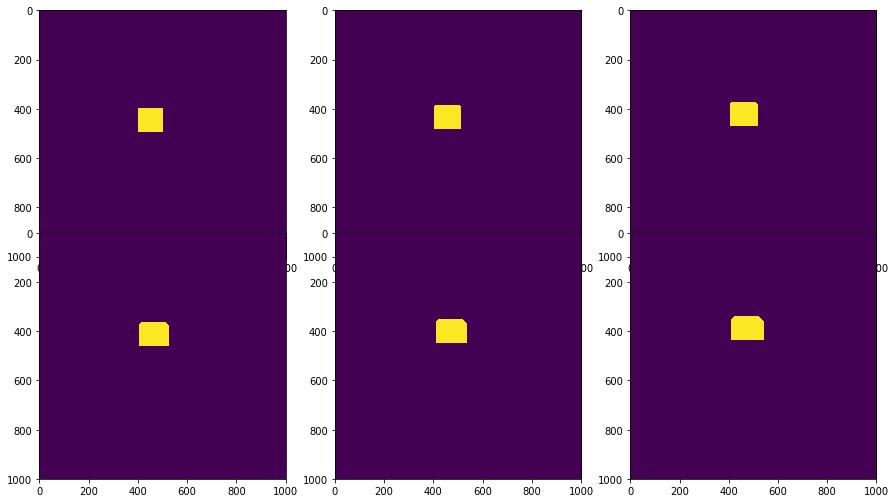

In [107]:
fig = plt.figure(figsize=(15,15))
fig.add_subplot(231)
plt.imshow(pred[0])
fig.add_subplot(232)
plt.imshow(pred[1])
fig.add_subplot(233)
plt.imshow(pred[2])
fig.add_subplot(131)
plt.imshow(pred[3])
fig.add_subplot(132)
plt.imshow(pred[4])
fig.add_subplot(133)
plt.imshow(pred[5])

### Issues after numerical implementation

**The issues remained for sovling 2-D advection diffusion equation are:**


1. the discontinuity (may be due to the incorrectness of the codes), and the stability needs to be checked.


2. Haven't tested the real world cloud images

## Analytical Solution

If the dispersion term can be simulated as Gaussian distribution, the analytical solution of the particle movement can be derived from that. The equations described as below:

$$
I(x,y,t) = \frac{I_{total}}{\sqrt{4\pi Dt}}exp(-\frac{(x-ut)^2+(y-vt)^2}{4Dt})
$$

In this way, the numerical diffusion can be mitigated

In [31]:
from numba import jit
@jit(nopython=True)
def fast_iter(m,n,D,dt, grid=2):
    X = np.arange(-100*grid,100*grid+100,100)
    Y = np.arange(-100*grid,100*grid+100,100)
    unit_I = np.zeros((len(X), len(Y)))
    for i in range(len(X)):
        for j in range(len(Y)):
            unit_I[i,j] = 1/(4*np.pi*D*dt)**0.5*np.exp(-(X[i]**2+Y[j]**2)/4/D/dt)
    unit_I = (unit_I-unit_I.min())/(unit_I.max()-unit_I.min())
    return unit_I


In [32]:
def ANA(curr_img, V, D,t,k=5):
    U = V[:,:,0]
    V = V[:,:,1]
    x,y = np.where(curr_img!=0)
#    print(x,y)
    next_img = np.zeros((1000,1000))
    for m,n in zip(x,y):
        d_x = U[m,n]*t
        d_y = V[m,n]*t
#        print(d_x, d_y)
        new_mat = fast_iter(m,n,D,dt=60)*curr_img[m,n]
        (trans_i, trans_j) = grid2grid(m,n,d_y,d_x)
        if 0<=trans_i+int(k/2)+1<999 and 0<=trans_j+int(k/2)+1<=999:
            try:
                next_img[trans_i-int(k/2):trans_i+int(k/2)+1, trans_j-int(k/2):trans_j+int(k/2)+1] += new_mat
            except ValueError:
                print(trans_i, trans_j, trans_i-int(k/2),trans_i+int(k/2)+1, trans_j-int(k/2),trans_j+int(k/2)+1)
#        print(next_img[trans_i-int(k/2):trans_i+int(k/2)+1, trans_j-int(k/2):trans_j+int(k/2)+1].shape)
        
#    print(trans_i, trans_j)
    return next_img


In [ ]:
def execute(curr_img,V):
    pred= []
    for t in range(60,1800,60):
        pred_img = ANA(curr_img, V, 100, 60)
        curr_img = pred_img.copy()
        if t%60==0:
            pred_img[pred_img<0.5] = 0
            pred_img[pred_img>=0.5] = 1
            scipy.misc.imsave(f'D:/Radar Projects/lizhi/for LiZhi/WindField/ADE-ana-{t}.png', pred_img)
            print(int(t/60),' mins processed')
            pred.append(pred_img)
    return pred
pred=execute(curr_img, V)

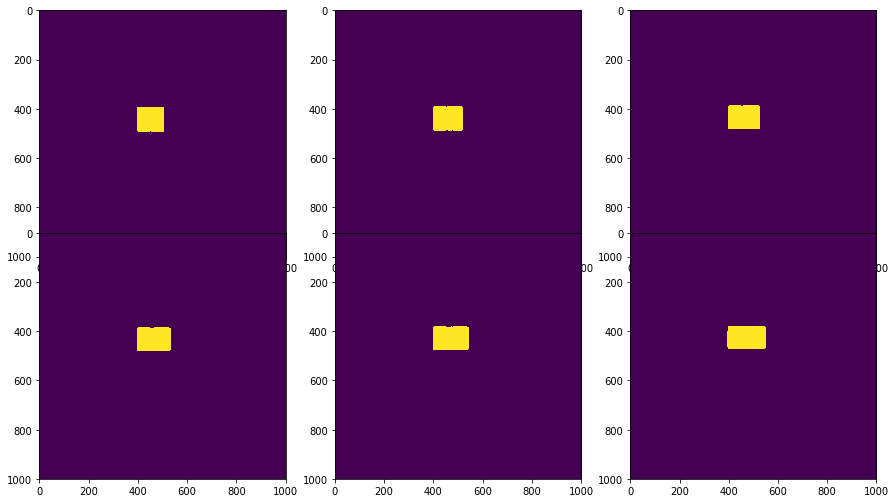

In [41]:
fig = plt.figure(figsize=(15,15))
fig.add_subplot(231)
plt.imshow(pred[0])
fig.add_subplot(232)
plt.imshow(pred[1])
fig.add_subplot(233)
plt.imshow(pred[2])
fig.add_subplot(131)
plt.imshow(pred[3])
fig.add_subplot(132)
plt.imshow(pred[4])
fig.add_subplot(133)
plt.imshow(pred[5])

### Issues of analytical solution:

**numerical discontinuity can be mitigated a lot. But still some problems stay:**


1. The diffusion coefficient needs to be calibrated


2. edges are not smooth enough (maybe some filters can adjust that)


3. How velocity field affects - the sort of reasonable range of velocity?


4. How intensity distribution affects the algorithm?

# Analytical Model for Improving Radar Nowcast

#### Parameter Description

**Functions:**

    1.fast_iter(m,n,D,dt,grid=2)
    --------------
    Args:
        m,n: the grid where rainfall intensity exists
        D: diffusion coefficient
        dt: time step
        grid: the matrix to generate Gaussian matrix. Square matrix
    --------------
    Return:
        mat: generated Gaussian matrix

    2. ANA(curr_img, V, D, t, k=5)
    --------------
    Args:
        curr_img: current radar image: (1000x1000)
        V: velocity field. (1000,1000,2), U=V[:,:,0]; V=V[:,:,1]
        D: diffusion coefficient
        t: time from the reference time
        k: corresponds with grid in <fast_iter>, square matrix in the predicted image to be replaced with
    --------------
    Returns:
        next_img: predicted image at next time stamp

    3. grid2grid(x,y,x_dis,y_dis)
    --------------
    Args:
        x,y: the grid(pixel) where rainfall exist
        x_dis, y_dis: the distance of that particular pixel moves
    --------------
    Returns:
        new translated x,y grid 
   
    4. execute: execution of the algorithm
    
    5.func_animate(i)
    -------------
    Des:
        You can specify anything about the frame and axes inside including a colorbar if cmap is shown.
    --------------
    Args:
        i: frame;
    --------------
    Returns:
        None
    --------------
    Usage:
        ani = animation.FuncAnimation(fig, func_animate, frames=30)
    
    6. make_animation()
    --------------
    Des:
        make some simple animations, cannot specify a colorbar
    --------------
    Usage:
        ani = make_animation(1860, curr_img,V,100, verbose=False)


In [2]:
def grid2grid(x,y,x_dis, y_dis):
    return (int(np.floor(x+x_dis/100.)), int(np.floor(y+y_dis/100.))) #distance divided by 100m per pixel

In [146]:
from numba import jit
@jit(nopython=True)
def fast_iter(m,n,D,dt, grid=2):
    X = np.arange(-100*grid,100*grid+100,100)
    Y = np.arange(-100*grid,100*grid+100,100)
    unit_I = np.zeros((len(X), len(Y)))
    for i in range(len(X)):
        for j in range(len(Y)):
            unit_I[i,j] = 1/(4*np.pi*D*dt)**0.5*np.exp(-(X[i]**2+Y[j]**2)/4/D/dt)
    unit_I = (unit_I-unit_I.min())/(unit_I.max()-unit_I.min())
    unit_I/=unit_I.sum()
    return unit_I

In [163]:
def ANA(curr_img, V, D,t,dt_D=10,k=5):
    U = V[:,:,0]
    V = V[:,:,1]
    x,y = np.where(curr_img!=0)
#    print(x,y)
    next_img = np.zeros((1000,1000))
    for m,n in zip(x,y):
        d_x = U[m,n]*t
        d_y = V[m,n]*t
#        print(d_x, d_y)
        (trans_i, trans_j) = grid2grid(m,n,d_y,d_x)
        if t%dt_D==0:
            if trans_i==m and trans_j==n:
                next_img[trans_i,trans_j]=curr_img[m,n]
            elif trans_i+int(k/2)+1<=999 and trans_j+int(k/2)+1<=999 and trans_i-int(k/2)>=0 and trans_j-int(k/2)>=0:
                try:
                    new_mat = fast_iter(m,n,D,dt=t)*curr_img[m,n]
                    max_I =max(curr_img[m,n], next_img[trans_i,trans_j])
                    next_img[trans_i-int(k/2):trans_i+int(k/2)+1, trans_j-int(k/2):trans_j+int(k/2)+1] += new_mat
                    next_img[trans_i, trans_j]=max_I
                except ValueError:
                    print(trans_i, trans_j, trans_i-int(k/2),trans_i+int(k/2)+1, trans_j-int(k/2),trans_j+int(k/2)+1)
            elif 0<=trans_i<=999 and 0<=trans_j<=999:
                next_img[trans_i, trans_j]= curr_img[m,n]
        else:
            next_img[trans_i,trans_j]=curr_img[m,n]
#        print(next_img[trans_i-int(k/2):trans_i+int(k/2)+1, trans_j-int(k/2):trans_j+int(k/2)+1].shape)
        
#    print(trans_i, trans_j)
    return next_img


In [229]:
def find_gap(mat, axis):
    mat= mat//100
    if axis==1:
        diff_mat=mat[:,1:]-mat[:,0:-1]
    elif axis==0:
        diff_mat=mat[1:,:]-mat[0:-1,:]
    x,y=np.where(diff_mat!=0)
    return x,y


In [237]:
def ANA_update(curr_img, V, D,t,dt_D=60,k=5):
    U = V[:,:,0]
    V = V[:,:,1]
    x,y = np.where(curr_img!=0)
#    print(x,y)
    next_img = np.zeros((1000,1000))
    D_x,D_y = U*t, V*t
    gap_x_1,gap_y_1=find_gap(D_x,1)
    gap_x_0,gap_y_0=find_gap(D_y,0)
    for m,n in zip(x,y):
        d_x = U[m,n]*t
        d_y = V[m,n]*t
#        print(d_x, d_y)
        (trans_i, trans_j) = grid2grid(m,n,d_y,d_x)
        if (m,n) in zip(gap_x_1, gap_y_1) or (m,n) in zip(gap_x_0,gap_y_0):
            if trans_i+int(k/2)+1<=999 and trans_j+int(k/2)+1<=999 and trans_i-int(k/2)>=0 and trans_j-int(k/2)>=0:
                try:
                    new_mat = fast_iter(m,n,D,dt=t)*curr_img[m,n]
                    max_I =max(curr_img[m,n], next_img[trans_i,trans_j])
                    next_img[trans_i-int(k/2):trans_i+int(k/2)+1, trans_j-int(k/2):trans_j+int(k/2)+1] += new_mat
                    next_img[trans_i, trans_j]=max_I
                except ValueError:
                    print(trans_i, trans_j, trans_i-int(k/2),trans_i+int(k/2)+1, trans_j-int(k/2),trans_j+int(k/2)+1)
            elif 0<=trans_i<=999 and 0<=trans_j<=999:
                next_img[trans_i, trans_j]= curr_img[m,n]
        elif 0<=trans_i<=999 and 0<=trans_j<=999:
            next_img[trans_i,trans_j]=curr_img[m,n]
#        print(next_img[trans_i-int(k/2):trans_i+int(k/2)+1, trans_j-int(k/2):trans_j+int(k/2)+1].shape)
        
#    print(trans_i, trans_j)
    return next_img

In [ ]:
def ANA_simple(curr_img, V, D,t,dt_D=60,k=5):
    U = V[:,:,0]
    V = V[:,:,1]
    x,y = np.where(curr_img!=0)
#    print(x,y)
    next_img = np.zeros((1000,1000))
    D_x,D_y = U*t, V*t
    gap_x_1,gap_y_1=find_gap(D_x,1)
    gap_x_0,gap_y_0=find_gap(D_y,0)
    for m,n in zip(x,y):
        d_x = U[m,n]*t
        d_y = V[m,n]*t
#        print(d_x, d_y)
        (trans_i, trans_j) = grid2grid(m,n,d_y,d_x)
        if (m,n) in zip(gap_x_1, gap_y_1) or (m,n) in zip(gap_x_0,gap_y_0):
            next_img[trans_i, trans_j]
        elif 0<=trans_i<=999 and 0<=trans_j<=999:
            next_img[trans_i,trans_j]=curr_img[m,n]
#        print(next_img[trans_i-int(k/2):trans_i+int(k/2)+1, trans_j-int(k/2):trans_j+int(k/2)+1].shape)
        
#    print(trans_i, trans_j)
    return next_img

In [224]:
def execute(curr_img,V, verbose=False):
    pred= []
    for t in range(0,120,60):
        pred_img = ANA(curr_img, V, 100, 60)
        curr_img = pred_img.copy()
        if t%60==0:
            pred_img[pred_img<0.5] = 0
            pred_img[pred_img>=0.5] = 1
#             scipy.misc.imsave(f'D:/Radar Projects/lizhi/for LiZhi/WindField/ADE-ana-{t}.png', pred_img)
            if verbose:
                print(int(t/60),' mins processed')
#             img = plt.imshow(pred_img)
            pred.append([pred_img])
#     plt.close()
    return pred


In [238]:
from matplotlib import animation
from IPython.display import HTML
def make_animation(t_max, curr_img,V,D,dt,binary=False, verbose=False):
    fig = plt.figure(figsize=(10,10));
    pred= []
    for t in range(0,t_max,dt):
        pred_img = ANA_update(curr_img, V, D, dt)
        curr_img = copy.deepcopy(pred_img)
        if t%60==0:
            if verbose:
                print(int(t/60),' mins processed')
            if binary:
                pred_img[pred_img<0.5]=0
                pred_img[pred_img>=0.5]=1
            img = plt.imshow(pred_img, animated=True)
#             print(pred_img.max())
#             cb=plt.colorbar(img)
            quiver = plt.quiver(np.arange(0,1000,100), np.arange(0,1000,100), V[0:1000:100,0:1000:100,0],-V[0:1000:100,0:1000:100,1], color='white')
            text = plt.text(400,-10,f'{int(t/60)} min',color='black')
            pred.append([img, text, quiver])
#             cb.remove()
            
    ani = animation.ArtistAnimation(fig, pred, interval=500, blit=True,
                                repeat_delay=1000)
    plt.colorbar(img)
    plt.close()
    return ani

In [81]:
CURR_IMG = curr_img
from mpl_toolkits.axes_grid1 import make_axes_locatable
fig = plt.figure()
ax = fig.add_subplot(111)
div = make_axes_locatable(ax)
cax = div.append_axes('right', '5%', '5%')

def func_animate(i):
    t=i*60
    pred = ANA(CURR_IMG, V, 35, t)
    CURR_img=pred.copy()
    cf = ax.imshow(pred)
    fig.colorbar(cf,cax=cax)
    ax.set_title(f'{int(t/60)} min')
    plt.cla()
    plt.close()
    
ani = animation.FuncAnimation(fig, func_animate, frames=30)

### Experiment 1: real radar images + Uniform velocity

#### Parameter description:

    D=10
    dt=60
    V=5 uniform
    Gaussian matrix: 5by5

In [139]:
os.chdir('D:\\Radar Projects\\lizhi\\for LiZhi\\WindField')
curr_img = np.matrix(Image.open('test_file.tif'))
V=np.ones((1000,1000,2))*5

#### Test setup efficiency

In [23]:
#with numba
%prun execute(curr_img,V)

In [33]:
#without numba
%prun execute(curr_img,V)

         15531292 function calls in 83.883 seconds

   Ordered by: standard name

   ncalls  tottime  percall  cumtime  percall filename:lineno(function)
   675612    5.792    0.000    5.792    0.000 <ipython-input-29-6afd1e7f5407>:1(grid2grid)
   675612   60.725    0.000   69.487    0.000 <ipython-input-30-99f3be05240a>:3(fast_iter)
        2    7.993    3.997   83.844   41.922 <ipython-input-31-2566ff7fa12c>:1(ANA)
        1    0.007    0.007   83.862   83.862 <ipython-input-32-6f70b8260fa6>:1(execute)
        1    0.021    0.021   83.883   83.883 <string>:1(<module>)
   675612    0.192    0.000    1.770    0.000 _methods.py:25(_amax)
  1351224    0.348    0.000    3.758    0.000 _methods.py:28(_amin)
        1    0.000    0.000    0.000    0.000 defmatrix.py:258(__array_finalize__)
   333906    0.472    0.000    0.560    0.000 defmatrix.py:280(__getitem__)
        1    0.000    0.000   83.883   83.883 {built-in method builtins.exec}
   333907    0.088    0.000    0.088    0.000 {bui

NUMBA module is way faster than without, generating one minute ahead with numba costs 15.8 seconds, while without numba it is 41.9 seconds.

Improvement **(To be done):**

    ......

In [79]:
ani = make_animation(1860, curr_img,V,10,dt=60, binary=False verbose=False)
HTML(ani.to_jshtml())

In [140]:
ani = make_animation(1860, curr_img,V,10,dt=60, binary=True, verbose=False)
HTML(ani.to_jshtml())

#### Summary

1. Eventually, all go to blends because of diffusion


### Experiment 2: real radar images + velocity gradient

Parameter Description:

    D=100
    dt=60
    V: the velocity ranges from 0 to 18 with interval of 2
    Gaussian matrix: 5by5
    

In [193]:
V = np.zeros((1000,1000,2))
V[:,:100,0]=2
V[:,100:200,0]=2
V[:,200:300,0]=4
V[:,300:400,0]=6
V[:,400:500,0]=8
V[:,500:600,0]=10
V[:,600:700,0]=12
V[:,700:800,0]=14
V[:,800:900,0]=16
V[:,900:1000,0]=18

V[:100,:,1]=2
V[100:200,:,1]=2
V[200:300,:,1]=4
V[300:400,:,1]=6
V[400:500,:,1]=8
V[500:600,:,1]=10
V[600:700,:,1]=12
V[700:800,:,1]=14
V[800:900,:,1]=16
V[900:,:,1]=18

KeyboardInterrupt: 

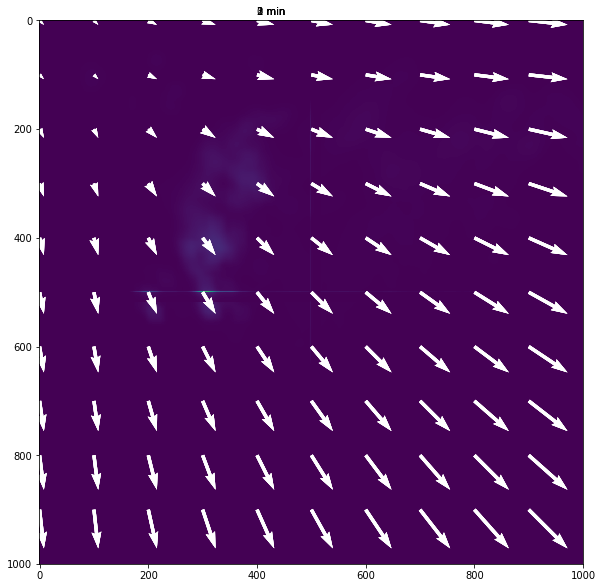

In [239]:
start = time.time()
ani = make_animation(660, curr_img,V,D=200,dt=10, verbose=False)
end=time.time()
print(f"elapsed time for 30 min is {round(end-start,2)} seconds")

In [160]:
HTML(ani.to_jshtml()) # timestep=30, D=200

In [165]:
HTML(ani.to_jshtml()) # timestep=10, D=200

In [92]:
ani = make_animation(1860, curr_img,V,D=100,binary=True, dt=60)
HTML(ani.to_jshtml())

### Experiment 3: real radar images + velocity gradient+low diffusion coefficient

Parameter description:
    
    D:1;
    dt=60;
    V: the same as experiment 2

In [93]:
ani = make_animation(1860, curr_img,V,D=1,binary=False, dt=60)
HTML(ani.to_jshtml())

Binary graphs

In [94]:
ani = make_animation(1860, curr_img,V,D=1,binary=True, dt=60)
HTML(ani.to_jshtml())

Things starts to break down because the diffusion coefficient is fairly low

### Experiment 4: real radar images + velocity gradient+intermediate diffusion coefficient

In [126]:
ani = make_animation(1860, curr_img,V,D=20,binary=False, dt=60)
HTML(ani.to_jshtml())

In [96]:
ani = make_animation(1860, curr_img,V,D=20,binary=True, dt=60)
HTML(ani.to_jshtml())

### Experiment 5 Radar Image + maximum velocity gradient

In [129]:
V = np.zeros((1000,1000,2))
V[:,:100,0]=2
V[:,100:200,0]=2
V[:,200:300,0]=4
V[:,300:400,0]=6
V[:,400:500,0]=8
V[:,500:600,0]=10
V[:,600:700,0]=12
V[:,700:800,0]=20
V[:,800:900,0]=20
V[:,900:,0]=20

V[:100,:,1]=2
V[100:200,:,1]=2
V[200:300,:,1]=4
V[300:400,:,1]=6
V[400:500,:,1]=8
V[500:600,:,1]=10
V[600:700,:,1]=12
V[700:800,:,1]=20
V[800:900,:,1]=20
V[900:,:,1]=20

In [130]:
ani = make_animation(1860, curr_img,V,D=20,binary=False, dt=60)
HTML(ani.to_jshtml())

In [99]:
ani = make_animation(1860, curr_img,V,D=20,binary=True, dt=60)
HTML(ani.to_jshtml())

In [131]:
V = np.zeros((1000,1000,2))
V[:,100:200,0]=-2
V[:,200:300,0]=-4
V[:,300:400,0]=-6
V[:,400:500,0]=-8
V[:,500:600,0]=-10
V[:,600:700,0]=-12
V[:,700:800,0]=-20
V[:,800:900,0]=-20
V[:,900:1000,0]=-20

V[100:200,:,1]=-2
V[200:300,:,1]=-4
V[300:400,:,1]=-6
V[400:500,:,1]=8
V[500:600,:,1]=10
V[600:700,:,1]=12
V[700:800,:,1]=20
V[800:900,:,1]=20
V[900:1000,:,1]=20

In [101]:
ani = make_animation(1860, curr_img,V,D=35,binary=True, dt=60)
HTML(ani.to_jshtml())

In [132]:
ani = make_animation(1860, curr_img,V,D=35,binary=False, dt=60)
HTML(ani.to_jshtml())